参考サイト
https://www.tensorflow.org/tutorials/keras/classification

スニーカーやシャツなど、身に着けるものの写真を分類するニューラルネットワークのモデルを訓練します。

In [1]:
# TensorFlow と tf.keras のインポート
import tensorflow as tf
from tensorflow import keras

# ヘルパーライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.9.1


ファッションMNISTデータセットのロード

In [2]:
fashion_mnist = keras.datasets.fashion_mnist

(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

クラス名が含まれていないため、後ほど画像を出力するときのために、クラス名を保存しておく。

In [3]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

訓練用データセットには28×28ピクセルの画像が60,000枚含まれている

In [4]:
train_images.shape

(60000, 28, 28)

訓練用データセットには60,000個のラベルが含まれている

In [5]:
len(train_labels)

60000

ラベルはそれぞれ、0から9までの間の整数

In [6]:
train_labels

array([9, 0, 0, ..., 3, 0, 5], dtype=uint8)

テスト用データセットには、10,000枚の画像が含まれます。画像は28×28ピクセルで構成されている

In [7]:
test_images.shape

(10000, 28, 28)

テスト用データセットには10,000個のラベルが含まれている

In [8]:
len(test_labels)

10000

データの前処理

最初の画像を調べてみればわかるように、ピクセルの値は0から255の間の数値である

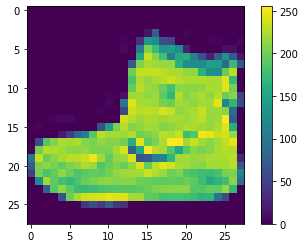

In [9]:
plt.figure()
plt.imshow(train_images[0])
plt.colorbar()
plt.grid(False)
plt.show()

正規化するため画素の値を255で割る

In [10]:
train_images = train_images / 255.0

test_images = test_images / 255.0

訓練用データセットの最初の25枚の画像を、クラス名付きで表示してみる

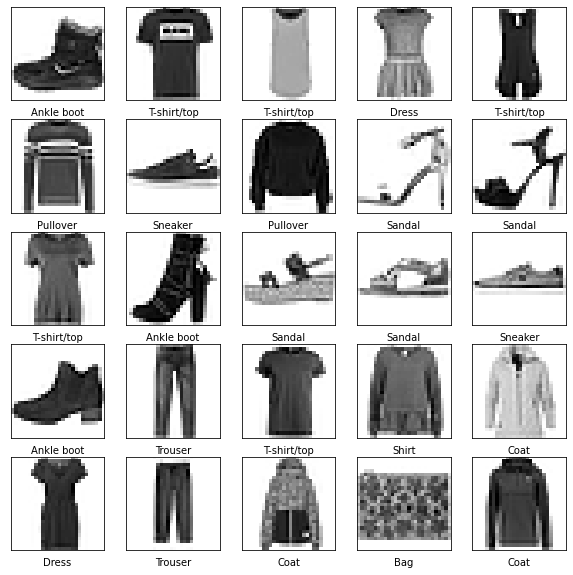

In [11]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

モデルの構築

層の設定

In [12]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])

モデルのコンパイル

In [13]:
model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

モデル訓練

In [14]:
model.fit(train_images, train_labels, epochs=5)

Epoch 1/5
1875/1875 [==============================] - 5s 2ms/step - loss: 0.5031 - accuracy: 0.8243
Epoch 2/5
1875/1875 [==============================] - 5s 2ms/step - loss: 0.3770 - accuracy: 0.8648
Epoch 3/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3391 - accuracy: 0.8750
Epoch 4/5
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3155 - accuracy: 0.8844
Epoch 5/5
1875/1875 [==============================] - 5s 2ms/step - loss: 0.2971 - accuracy: 0.8906


正解率の評価

In [15]:
test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print('\nTest accuracy:', test_acc)

313/313 - 1s - loss: 0.3803 - accuracy: 0.8653 - 706ms/epoch - 2ms/step

Test accuracy: 0.8652999997138977


予測する

In [16]:
predictions = model.predict(test_images)

313/313 [==============================] - 0s 1ms/step


最初の予測を見る

In [17]:
predictions[0]

array([3.7374821e-06, 6.7318409e-09, 4.6705497e-09, 8.9888978e-11,
       2.6114906e-08, 3.2604749e-03, 3.9594275e-07, 5.7944595e-03,
       2.8745912e-06, 9.9093807e-01], dtype=float32)

この画像がアングルブーツである可能性が高いと判断してる

In [18]:
np.argmax(predictions[0])

9

In [19]:
test_labels[0]

9

10チャンネルすべてをグラフ化する

In [20]:
def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                    100*np.max(predictions_array),
                                    class_names[true_label]),
                                    color=color)

def plot_value_array(i, predictions_array, true_label):
    predictions_array, true_label = predictions_array[i], true_label[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    thisplot = plt.bar(range(10), predictions_array, color="#777777")
    plt.ylim([0, 1]) 
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

0番目の画像と、予測、予測配列を見る

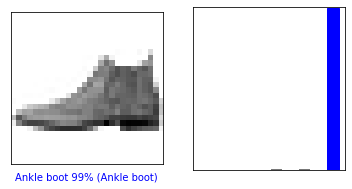

In [21]:
i = 0
plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plot_image(i, predictions, test_labels, test_images)
plt.subplot(1,2,2)
plot_value_array(i, predictions,  test_labels)
plt.show()

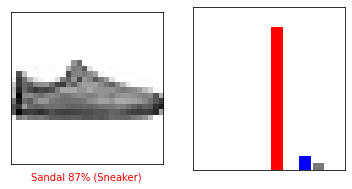

In [22]:
i = 12
plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plot_image(i, predictions, test_labels, test_images)
plt.subplot(1,2,2)
plot_value_array(i, predictions,  test_labels)
plt.show()

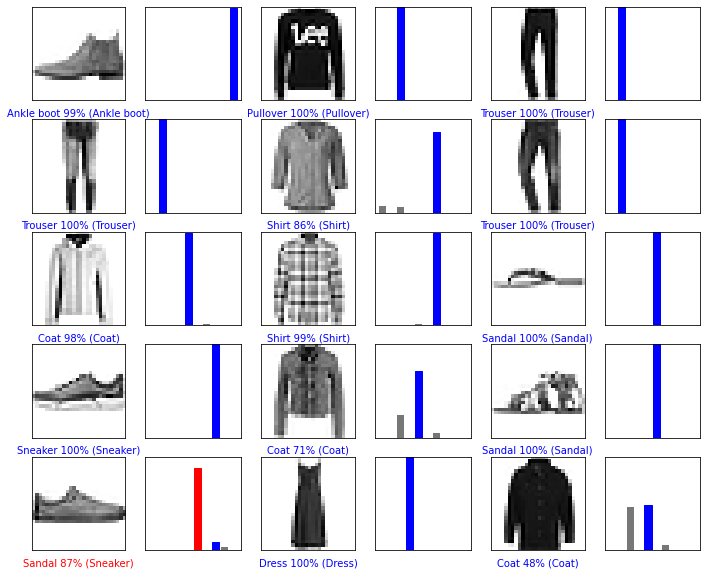

In [23]:
# X個のテスト画像、予測されたラベル、正解ラベルを表示します。
# 正しい予測は青で、間違った予測は赤で表示しています。
num_rows = 5
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_image(i, predictions, test_labels, test_images)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_value_array(i, predictions, test_labels)
plt.show()

訓練済みモデルを使って1枚の画像に対する予測を行う

In [24]:
# テスト用データセットから画像を1枚取り出す
img = test_images[0]

print(img.shape)

(28, 28)


In [25]:
# 画像を1枚だけのバッチのメンバーにする
img = (np.expand_dims(img,0))

print(img.shape)

(1, 28, 28)


In [26]:
predictions_single = model.predict(img)

print(predictions_single)

1/1 [==============================] - 0s 22ms/step
[[3.7374750e-06 6.7318155e-09 4.6705497e-09 8.9889159e-11 2.6114954e-08
  3.2604733e-03 3.9594275e-07 5.7944623e-03 2.8745940e-06 9.9093807e-01]]


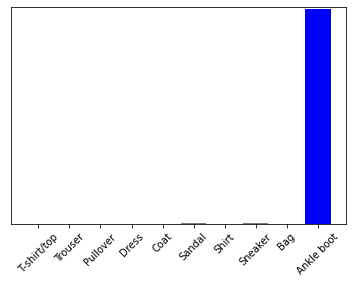

In [27]:
plot_value_array(0, predictions_single, test_labels)
_ = plt.xticks(range(10), class_names, rotation=45)

In [28]:
np.argmax(predictions_single[0])

9

In [29]:
# MIT License
#
# Copyright (c) 2017 François Chollet
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

配列平坦化

In [30]:
train_images = np.array([np.array(img).flatten() for img in train_images])
np.array(train_images).shape

(60000, 784)

In [31]:
test_images = np.array([np.array(img).flatten() for img in test_images])
np.array(test_images).shape

(10000, 784)

onehotlabel表現

In [32]:
def _change_one_hot_label(X):
    T = np.zeros((X.size, 10))
    for idx, row in enumerate(T):
        row[X[idx]] = 1

    return T

train_labels = _change_one_hot_label(train_labels)
test_labels = _change_one_hot_label(test_labels)

認識精度

[[-0.30928235  0.08930875 -0.03868981 ... -0.1881383   0.32965262
   0.15762233]
 [-0.04793587  0.03898255 -0.07869302 ... -0.0056428   0.00402582
   0.00799811]
 [-0.1920459   0.03887379 -0.00421593 ...  0.03319388  0.09734021
   0.06802049]
 ...
 [-0.07910458  0.03035785 -0.03007363 ... -0.03013745  0.08312788
   0.01606   ]
 [-0.12367479 -0.0028139  -0.03422011 ... -0.09478212  0.1226896
   0.13194771]
 [-0.10150335 -0.02694534  0.00044974 ...  0.05107499  0.02159322
   0.08637272]]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
train acc, test acc | 0.14868333333333333, 0.1497
[[-0.17518661 -0.07179867 -0.02782474 ... -0.03737398  0.2195337
   0.02213119]
 [-0.14855825  0.05099075  0.00218746 ... -0.04470914  0.07581773
   0.17448736]
 [-0.16409075 -0.100938    0.01073345 ... -0.00881484  0.1716803
   0.03774448]
 ...
 [-0.118416    0.01833002  0.00485987 ... -0.12896323  0.23

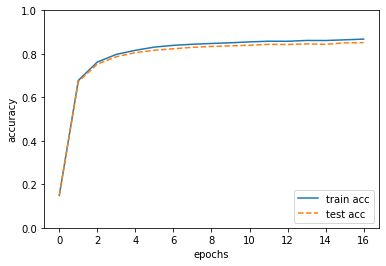

In [33]:
from two_layer_net import TwoLayerNet

network = TwoLayerNet(input_size=784, hidden_size=50, output_size=10)

iters_num = 10000  # 繰り返しの回数を適宜設定する
train_size = train_images.shape[0]
batch_size = 100
learning_rate = 0.1

train_loss_list = []
train_acc_list = []
test_acc_list = []
#1エポックあたりの繰り返し数
iter_per_epoch = max(train_size / batch_size, 1)

for i in range(iters_num):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = train_images[batch_mask]
    t_batch = train_labels[batch_mask]
    
    # 勾配の計算
    #grad = network.numerical_gradient(x_batch, t_batch)
    grad = network.gradient(x_batch, t_batch) #高速版
    
    # パラメータの更新
    for key in ('W1', 'b1', 'W2', 'b2'):
        network.params[key] -= learning_rate * grad[key]
    
    loss = network.loss(x_batch, t_batch)
    train_loss_list.append(loss)
    
    #1エポックごとに認識精度を計算
    if i % iter_per_epoch == 0:
        train_acc = network.accuracy(train_images, train_labels)
        test_acc = network.accuracy(test_images, test_labels)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)
        print("train acc, test acc | " + str(train_acc) + ", " + str(test_acc))

# グラフの描画
markers = {'train': 'o', 'test': 's'}
x = np.arange(len(train_acc_list))
plt.plot(x, train_acc_list, label='train acc')
plt.plot(x, test_acc_list, label='test acc', linestyle='--')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()